In [ ]:
pip install tensorflow==2.15

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 42.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 38.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 69.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 26.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 6.8 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.16.0
    Uninstalling wrapt-1.16.0:
      Successfully uninstalled wrapt-1.16.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtypes-0.4.1
  Attempting uninstall: keras
    Found existing installation: keras 3.4.1
    Uninstalling keras-3.4.1:
      Successfully uninstalled keras-3.4.1
  Attempting uninstall: tensorboard
    Found existing installation

# End-to end multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifing the breed of a dog given the image of a dog.

"When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is."

## 2. Data

The data we're using is from Kaggle's Dog Breed identification competion:
https://www.kaggle.com/competitions/dog-breed-identification/data?select=labels.csv

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes.)
* There are around 10,000+ images in the training set (these images have labels)
* There are around 10,000+ images in the test set (these images have no labels because we will want to predict them).

### Get Our Workspace ready

*   Import TensorFlow 2.x
*   Import TensorFlow Hub (where we pick our model)
*   Make sure we are using a GPU



In [ ]:
# Import TensorFlow into Colab
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.15.0


In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF Version:", tf.__version__)
print("TF Hub version", hub.__version__)

# Check for GPU availability # If not, Change Runtime Type
print("GPU", "available (Yesss!!!)" if tf.config.list_physical_devices("GPU") else "not available :()")

TF Version: 2.15.0
TF Hub version 0.16.1
GPU available (Yesss!!!)


## Getting our data ready (turning it into Tensors)

With all machine learning models, our data has to be in numerical format. So thats what we'll be doing first. Turning our images into Tensors( Numerical representation)

Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/Dog Breed /labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


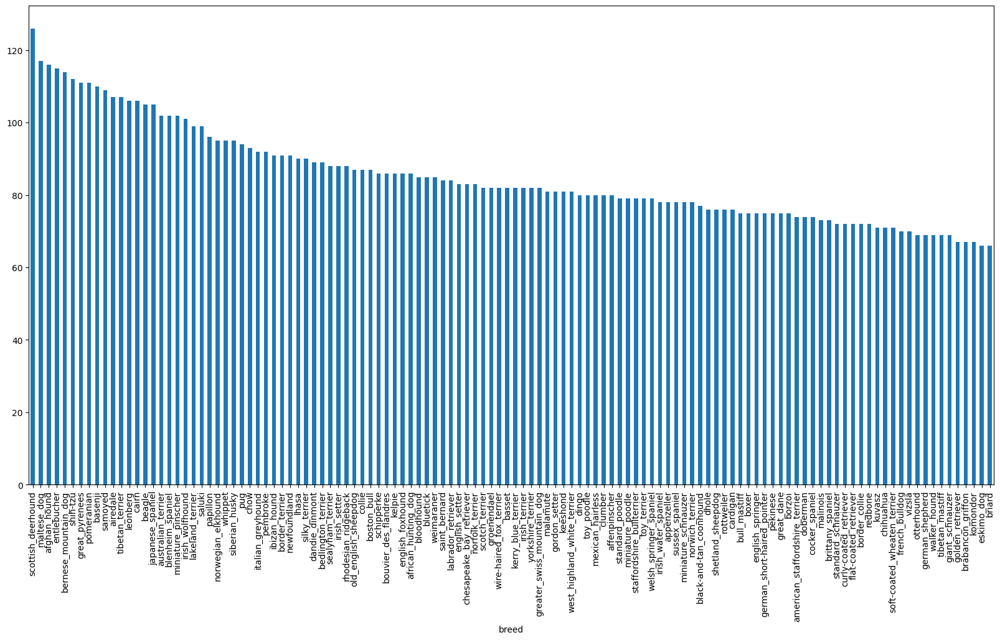

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10));

In [ ]:
#Check out the distirbution, about 82 or so images per class (breed
labels_csv["breed"].value_counts().median()

82.0

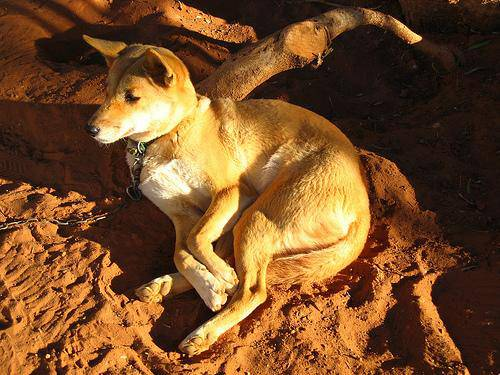

In [ ]:
#Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/Dog Vision/Dog Breed /train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all of our image file pathnames

In [ ]:
# Create pathnames from image ID's
filenames = ["/content/drive/MyDrive/Dog Vision/Dog Breed /train/"+ fname + ".jpg" for fname in labels_csv["id"]]

# Check the forst 10
filenames[:10]

['/content/drive/MyDrive/Dog Vision/Dog Breed /train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/Dog Breed /train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/Dog Breed /train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/Dog Breed /train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/Dog Breed /train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/Dog Breed /train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/Dog Breed /train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/Dog Breed /train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/Dog Breed /train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/Dog Breed /train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/Dog Vision/Dog Breed /train")) == len(filenames):
  print("Filenames match amount of files!!! Proceed.")
else:
    print("Filenames do not match actual of files, check the target directory")

Filenames match amount of files!!! Proceed.


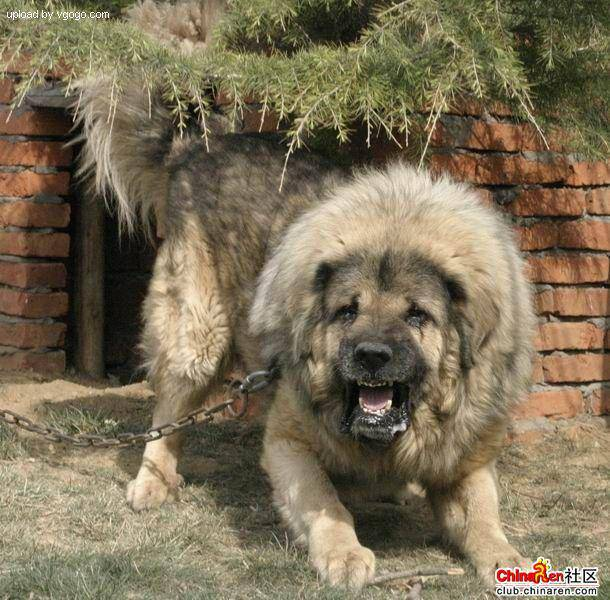

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

*Since* we've now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) #does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames - checking for missing data (unstructured data)
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels do not match the number of filenames :/")

Number of labels matches number of filenames!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turn a single lael into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) #original label
print(np.where(unique_breeds == labels[0])) # index where labels occurs
print(boolean_labels[0].argmax()) #index where label occurs in boolean array
print(boolean_labels[0].astype(int)) #there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['/content/drive/MyDrive/Dog Vision/Dog Breed /train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/Dog Breed /train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/Dog Breed /train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/Dog Breed /train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/Dog Breed /train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/Dog Breed /train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/Dog Breed /train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/Dog Breed /train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/Dog Breed /train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/Dog Breed /train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set
Since the dataset from Kaggle doesnt come with a validation set, we are going to create our own

In [ ]:
# Set up x and y variables
x = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
#Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
#Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

#Split them into training and validation of total size NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                    y[:NUM_IMAGES],
                                                      test_size=0.2,
                                                      random_state=42)

len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a look at the training data
# training labels in boolean labels
x_train[:5], y_train[:2]

(['/content/drive/MyDrive/Dog Vision/Dog Breed /train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog Vision/Dog Breed /train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dog Vision/Dog Breed /train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dog Vision/Dog Breed /train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Dog Vision/Dog Breed /train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, 

### Preprocessing Images (turning images into Tensors )
To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the image  to be a shape of (224, 224)
5. Return the modified `image`

Before we do, let's see what importing an image looks like.

In [ ]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[1])
image.shape

(375, 500, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
#This is an array
image[:2]

array([[[ 51,  34,  26],
        [ 55,  38,  30],
        [ 61,  43,  33],
        ...,
        [127,  92,  62],
        [ 77,  42,  12],
        [167, 132, 102]],

       [[ 63,  44,  37],
        [ 64,  46,  36],
        [ 63,  45,  35],
        ...,
        [113,  82,  54],
        [ 44,  13,   0],
        [ 71,  40,  12]]], dtype=uint8)

In [ ]:
# This is a Tensor - turn image in a tensor
tf.constant(image)[:2]
# The difference is this Tensor is on tensor and able to run on a GPU, so alot faster compute
#So our GPU will be able to find patterns in these number alot faster than a CPU (on current machine) and like in the array above

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[ 51,  34,  26],
        [ 55,  38,  30],
        [ 61,  43,  33],
        ...,
        [127,  92,  62],
        [ 77,  42,  12],
        [167, 132, 102]],

       [[ 63,  44,  37],
        [ 64,  46,  36],
        [ 63,  45,  35],
        ...,
        [113,  82,  54],
        [ 44,  13,   0],
        [ 71,  40,  12]]], dtype=uint8)>

Now we've seen what an image looks like as a tensor, let's make a function to preprocess them.

1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable, image
3. Turn our image (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1).
5. Resize the image to be a shape of (224, 224)
6. Return the modified image


In [ ]:
# Define image size
IMG_SIZE = 224

#Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns them image into a Tensor.
  """

  #Read an image file
  image = tf.io.read_file(image_path)
  #Turn the jpeg image into numerical Tensor with 3 color channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)
  #Convert the color channel values from 0-255 to 0-1 values - called Normalization
  image = tf.image.convert_image_dtype(image, tf.float32)
  #Resize the image to our desired calue (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

Tensor likes to see things in a data batch aka a tensor containing an image example or a piece of data example
batch - a small portion of your data -- with most deep learning model 32 is normally the default batch size

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory. It could be more than the RAM memory you have.

So thats why we do about 32 images (this is the batch size) at a time (you can manually adjust the batch size if need be.)

In order to use TensorFlow effectively, we need our data in the for of Tensor tuples which look like this:
`(image, label)`.

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label, processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
process_image(x[42], tf.constant(y[42]))

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, lets make a function to turn all of our data `(x & y)` into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

#Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs. Shuffles the data if it's training data but doesnt shuffle if its validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths (no labels), turn all x into tensors, now need to batch them
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we dont need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), #filepaths
                                               tf.constant(y))) #labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    #Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffleing images
    data = data.shuffle(buffer_size=len(x))

    #Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    ##Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Checkout the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, hpwever, these can be a little hard to unerstand/comprehend, let's visualize them.

In [ ]:
import matplotlib.pyplot as plt

#Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels form a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    #Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    #Display as image
    plt.imshow(images[i])
    # Add the image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
unique_breeds[y[1].argmax()]

'dingo'

In [ ]:
# Batch
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#Need to unwind the batch and turn it into a numpy
# So we took our train data, unbatched it, using as numpy iterator or turned it into an iterator- take a next (the batch off the top) and returned the images and the labels
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.10626658, 0.08725397, 0.0308464 ],
          [0.11963341, 0.06711239, 0.0233799 ],
          [0.16089171, 0.06465337, 0.03598682],
          ...,
          [0.37286413, 0.33364844, 0.28658962],
          [0.37979692, 0.3405812 , 0.2935224 ],
          [0.37104338, 0.3318277 , 0.28476888]],
 
         [[0.11626613, 0.10364498, 0.05509736],
          [0.1000637 , 0.05217751, 0.01569957],
          [0.14221463, 0.06226194, 0.03548146],
          ...,
          [0.37686974, 0.33765402, 0.2905952 ],
          [0.38372514, 0.34450942, 0.2974506 ],
          [0.37500873, 0.33579305, 0.28873423]],
 
         [[0.10190132, 0.09943283, 0.05774865],
          [0.13343142, 0.10406343, 0.07086139],
          [0.11466799, 0.05006128, 0.02953432],
          ...,
          [0.38721702, 0.3480013 , 0.30094248],
          [0.3870011 , 0.34778538, 0.30072656],
          [0.3815739 , 0.34235817, 0.29529935]],
 
         ...,
 
         [[0.29094064, 0.09094065, 0.        ],
          [0.30466

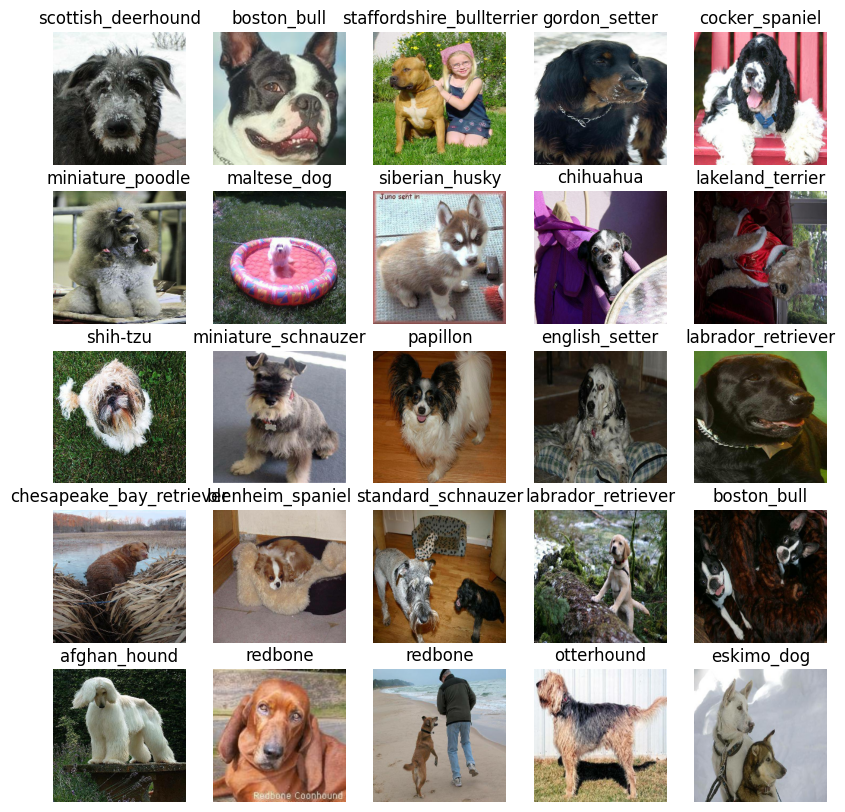

In [ ]:
# Now lets visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

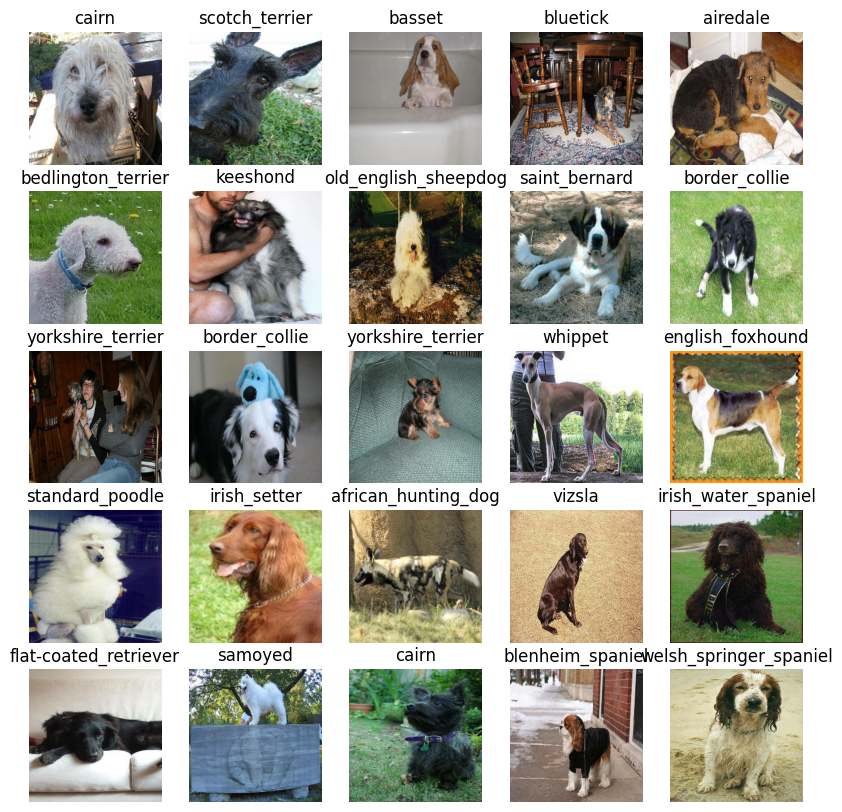

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub.
https://www.tensorflow.org/hub

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

Now we've got our inputs, outputs, and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:

* Takes the input shape, output shape and the model wi've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that)
* Complies the model (says it should be evaluated and omporved)
* Builds the model (tells the model the input shape it'll be getting).
* Retuns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers, instantiation the model
  #We are passing Keras Sequential a input (dog) an then mobile net v2 (Model_URL) will find the patterns inside of it
  model = tf.keras.Sequential([
     hub.KerasLayer(MODEL_URL), #Layer 1 (input layer)
     tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  #Compile the model, putting the model together ; how to model is going to learn
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), #loss is the measure on how well the modeling it gyuessing, the higher the loss the worst the prediction | Research how to choose a loss function
      optimizer=tf.keras.optimizers.Adam(), #Adam is optimizer (tell you how to lower the loss function), bc model is going through the data for the first time trying to learn patterns
      metrics=["accuracy"] #the judge, the accuracy on how well model is predicting the correct image label
  )

  #Build the model
  model.build(INPUT_SHAPE)


  return model


In [ ]:
model = create_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callback

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress, or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.


### TensorBoard Callback

To setup a Tensorboard callback, we need to do three things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our models `fit`function
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training)



In [ ]:
# Load Tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a Tensorboard callback
# every time we run this function will create a path in logs with thw name appended to it of the current datetime
def create_tensorboard_callback():
  #Create a log directory for storing logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/Dog Breed/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%m%d%Y-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)


### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a Model (on a subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we are still running on a GPU
print("GPU", "available (YESSS)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSS)


Let's create a function which trains a model.

*   Create a model using `create_model()`
*   Setup a TensorBoard callback using `create_tensorboard_callback()`
Call the `fit` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and trtur a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new Tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it in the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  #Return the fitted model
  return model

In [ ]:
#Fit the model to the data
model = train_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Epoch 1/100
25/25 [==============================] - 198s 238ms/step - loss: 4.5915 - accuracy: 0.1000 - val_loss: 3.3378 - val_accuracy: 0.2700
Epoch 2/100
25/25 [==============================] - 4s 177ms/step - loss: 1.6465 - accuracy: 0.6737 - val_loss: 2.1533 - val_accuracy: 0.5200
Epoch 3/100
25/25 [==============================] - 5s 210ms/step - loss: 0.5795 - accuracy: 0.9350 - val_loss: 1.6701 - val_accuracy: 0.6000
Epoch 4/100
25/25 [==============================] - 5s 184ms/step - loss: 0.2554 - accuracy: 0.9875 - val_loss: 1.5022 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 5s 214ms/step - loss: 0.1519 - accuracy: 0.9975 - val_loss: 1.4261 - val_accuracy: 0.6550
Epoch 6/100
25/25 [==============================] - 4s 163ms/step - loss: 0.1027 - accuracy: 0.9987 - val_loss: 1.3659 - val_accuracy: 0.6800
Epoch 7/100
25/25 [=================

**Questions:** It looks like our model is overfitting because its performing far better on the training dataset then the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Over fitting to begin with is a good thing! It means our model is learning!!!

### Checking the TensorBoard logs

The TensorBoard magic function (`tensorboard`) will access the logs directory we created earlier and visualize its contents

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Breed/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating prediction using aa trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 2s 162ms/step


array([[6.1246711e-03, 1.2817071e-04, 9.7639172e-04, ..., 7.8406098e-05,
        5.3168464e-05, 2.0791324e-02],
       [1.7799364e-04, 1.8891030e-04, 1.8290762e-02, ..., 1.5250302e-03,
        2.1910667e-03, 1.9854988e-04],
       [8.4540974e-05, 2.0478076e-04, 8.2561797e-05, ..., 1.1467742e-04,
        8.3725790e-05, 2.6483560e-04],
       ...,
       [3.8444714e-06, 2.4510782e-05, 9.8079181e-06, ..., 1.2898365e-05,
        7.0954688e-05, 8.3040541e-05],
       [1.6121466e-02, 1.2637831e-04, 1.4346866e-04, ..., 2.1989057e-04,
        1.8346499e-04, 1.1249085e-02],
       [8.7763631e-04, 8.9583416e-05, 1.7169844e-03, ..., 7.0571792e-03,
        7.8748615e-04, 6.9630943e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
np.sum(predictions[0])

0.9999999

In [ ]:
predictions[0] # Means we are finding the max value in thiese array (numbers Next cell below )

array([6.12467108e-03, 1.28170708e-04, 9.76391719e-04, 6.55178083e-05,
       9.90116270e-04, 1.15771154e-05, 5.08818775e-03, 3.97296564e-04,
       7.32119603e-04, 6.75417308e-04, 2.39614426e-04, 1.16204385e-04,
       2.88513256e-04, 3.32102500e-05, 5.26288233e-04, 2.54373939e-04,
       7.94224889e-06, 2.70468947e-02, 5.21687161e-06, 8.61189837e-05,
       1.01087389e-04, 3.84349150e-05, 6.56240518e-05, 3.59340571e-03,
       1.93028372e-05, 2.61126315e-05, 3.05893242e-01, 8.18623172e-04,
       1.10491423e-03, 6.28251582e-04, 1.72337059e-05, 2.03279196e-04,
       4.90130449e-04, 1.03060956e-05, 2.50460813e-04, 3.26205269e-02,
       1.14884797e-05, 1.83093967e-03, 4.18893869e-05, 3.82235448e-04,
       2.14792346e-03, 2.76811224e-05, 9.63060447e-05, 5.64660411e-04,
       8.41826659e-06, 3.77240285e-05, 4.66317979e-05, 2.49991921e-04,
       3.07914364e-04, 2.05029908e-04, 8.75982951e-05, 4.30124819e-05,
       5.60224231e-04, 1.96030203e-04, 3.99392411e-05, 2.08033034e-05,
      

In [ ]:
# First prediction
index = 0
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # The long array of numbers are prediction probabilites
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[6.12467108e-03 1.28170708e-04 9.76391719e-04 6.55178083e-05
 9.90116270e-04 1.15771154e-05 5.08818775e-03 3.97296564e-04
 7.32119603e-04 6.75417308e-04 2.39614426e-04 1.16204385e-04
 2.88513256e-04 3.32102500e-05 5.26288233e-04 2.54373939e-04
 7.94224889e-06 2.70468947e-02 5.21687161e-06 8.61189837e-05
 1.01087389e-04 3.84349150e-05 6.56240518e-05 3.59340571e-03
 1.93028372e-05 2.61126315e-05 3.05893242e-01 8.18623172e-04
 1.10491423e-03 6.28251582e-04 1.72337059e-05 2.03279196e-04
 4.90130449e-04 1.03060956e-05 2.50460813e-04 3.26205269e-02
 1.14884797e-05 1.83093967e-03 4.18893869e-05 3.82235448e-04
 2.14792346e-03 2.76811224e-05 9.63060447e-05 5.64660411e-04
 8.41826659e-06 3.77240285e-05 4.66317979e-05 2.49991921e-04
 3.07914364e-04 2.05029908e-04 8.75982951e-05 4.30124819e-05
 5.60224231e-04 1.96030203e-04 3.99392411e-05 2.08033034e-05
 7.69699182e-05 4.65311389e-03 1.01008313e-03 1.44747168e-01
 2.17630484e-04 6.95727113e-06 8.66222661e-03 1.00812234e-04
 1.08743203e-03 1.370696

In [ ]:
# Reminder of unique breeds
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

Having the above functionality is great, but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabiliters are also know as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

#Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0] #chnage the numbers
                            )
pred_label
#Making our predicitions more easy to view with eyes

'cairn'

Now since our validation data is still in a batch dataset, we'll have to unbatch it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels)

In [ ]:
val_data # get each of these images into separate iterators

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensors and returns separate arrays of images and labels
  """
  images_ = []
  labels_ = []

  #Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])
  return images_, labels_

  #Unbatchify the vaildation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

Now we've got ways to get:
* Prediction labels
* Validation lanels (truth labels)
* Validation images

Let's make some function to make these all a bit more visaulize.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image of a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  #Get the pred label
  pred_label = get_pred_label(pred_prob)

  #Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([]) #Dont show ticks
  plt.yticks([]) #Dont show ticks

  #Change the colour of the title depending on if the predictin is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
      color = "red"

  #Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

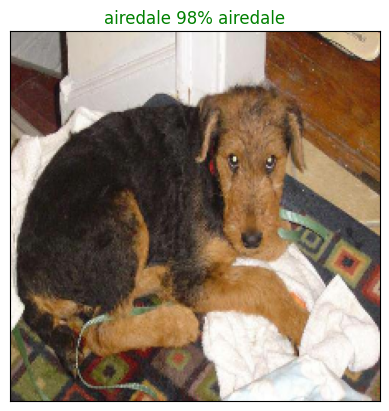

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=4,
          ) # change number to see different predictions

**!!  Now just built a deep learning model thats able to take photos of dogs and predict what kinds of breed it is/ what kind of breed it is. **bold text**

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 prediction

This function will:
* Take an input of prediction probabilities array and a ground truth array and an imteger
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  #Get the predicted label
  pred_label = get_pred_label(pred_prob)

  #Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), # x values of bar plot to be prediction labels, we are creating a range of 10 (we want 10 bars on our plot)
                    top_10_pred_values, # the prediction probabilities for each samples
                    color = "grey")

  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  #Change color of true label if value isin array
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


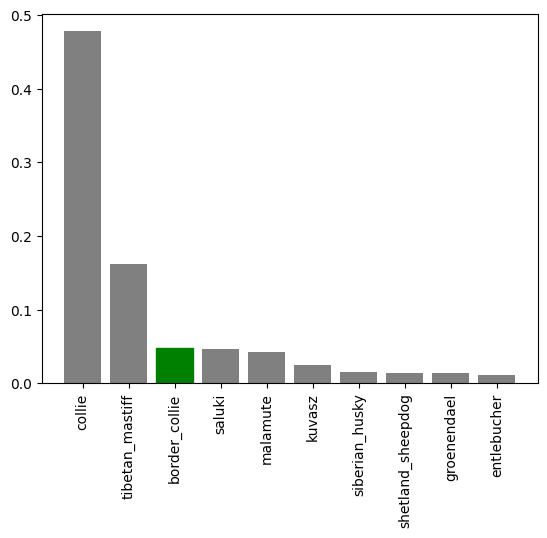

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

In [ ]:
# Samples cells to view function
# These are the top 10 indexes of prediction 0
predictions[0].argsort()[-10:][::-1]

array([ 26,  59, 103,  70, 109,  68,  35, 106,  17,  73])

In [ ]:
# Samples cells to view function
# These are the top 10 labels our model has predicted for item 0
unique_breeds[predictions[0].argsort()[-10:][::-1]]

array(['cairn', 'irish_wolfhound', 'soft-coated_wheaten_terrier', 'lhasa',
       'tibetan_terrier', 'lakeland_terrier', 'dandie_dinmont',
       'standard_schnauzer', 'border_terrier', 'maltese_dog'],
      dtype=object)

In [ ]:
# Samples cells to view function
predictions[0].max()

0.30589324

Now we've got some fucntions to help us visualize our predictions and evaluate our model, let's check out a few

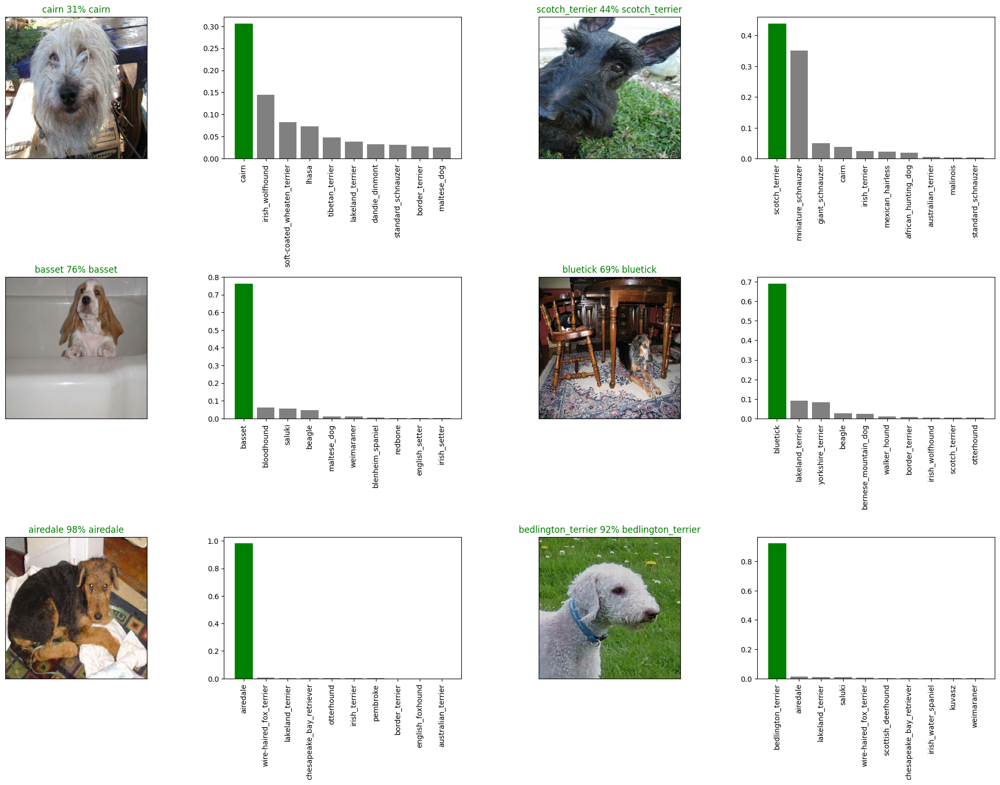

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 0 # modifies our n, can try next 10 images
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                 n=i+i_multiplier)

# Dont show plot inside the loop
plt.tight_layout(h_pad=1.0)
plt.show()

** CHallenge:** How would you create a confusion matrix with our models predictions and true labels?

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
  """
  Saves a gicen model in a models directory and appends a suffix (string).
  """
  #Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/Dog Vision/Dog Breed/Models",
                          datetime.datetime.now().strftime("%m%d%Y-%H%M%s"))
  model_path = modeldir + "-" + suffix ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path


IndentationError: unexpected indent (<ipython-input-75-0e789b5a3f4d>, line 2)

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained mode, lets make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

In [ ]:
# Load a trained model
loaded_1000_image_model('#### copy path above ')

In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

In [ ]:
# Evaluate the loaded model
loaded_1000_inage_model.evaluate(val_data)

:## Training a big dog model (on the full data)

In [ ]:
len(x), len(y)

In [ ]:
x[:10]

In [ ]:
len(x_train)

In [ ]:
y[:2]

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(x,y)

In [ ]:
full_data

In [ ]:
# Create a model for full model
full_model = create_model()

In [ ]:
#Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we cant monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 mins for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data -- "About to train our first full deep learning model on 10000 plus images" "Training first end-to-end deep learning neural network"
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

In [ ]:
Automatically call the save function to save model right after
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

In [ ]:
# Load in the full model
loaded_full_model = load_model("copy path above")

## Making prediction on test data set

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we''ll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches` and setting the `test_data` parameter to `True` (since the test data doesnt have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model

In [ ]:
# Load test image filenames
test_path = "drive/My Drive/Dog/ Vision/Dog Breed/test"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

In [ ]:
len(test_filenames)

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

In [ ]:
test_data

**Note** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about an ~1 hour).

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/My Drive/Dog Vision/Dog Breed/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
#Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]
#These are all prediction probabilities

In [ ]:
test_predictions.shape

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.

To get the data in this format, we'll:
* Create a pandas DataFrams with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from thier filepaths
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
#Create a Pandas DataFrame
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

In [ ]:
# Append test image ids to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

In [ ]:
# splits off the last little bit of the path
os.path.splitext(test_filenames[0])

In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

In [ ]:
#Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/My Drive/Dog Vision/Dog Breed/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

# We used Transfer Learning Mobile Net V2

## Making Predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images
* Turn the file paths into data batches using `create_data_batches()`. And since our custom images wont have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* COnvert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom imaages.

In [ ]:
# Get custom image filepaths
custom_path = "drive/My Drive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
custom_preds.shape

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_preds_labels

In [ ]:
# Get custom images (our unbatchify() function wont work since there arent labels... maybe we could fix this later)
custom_images = []
#Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

In [ ]:
plt.figure(figsize=(10, 8))
plt.imshow(unique_breeds, cmap='hot', interpolation='nearest')
plt.colorbar()
plt.title('Heat Map using Matplotlib')
plt.show()
